# Vision HW3

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os
import cv2
from scipy.spatial.distance import euclidean
from scipy.spatial.distance import cdist
import skimage
from skimage.io import imread
from skimage.color import rgb2gray
from matplotlib import cm
from skimage.color import label2rgb
from scipy.io import loadmat,savemat
import scipy.io
from scipy.ndimage import maximum_filter
from matplotlib.colors import ListedColormap
import glob

## Visualize frames, templates, and graidents

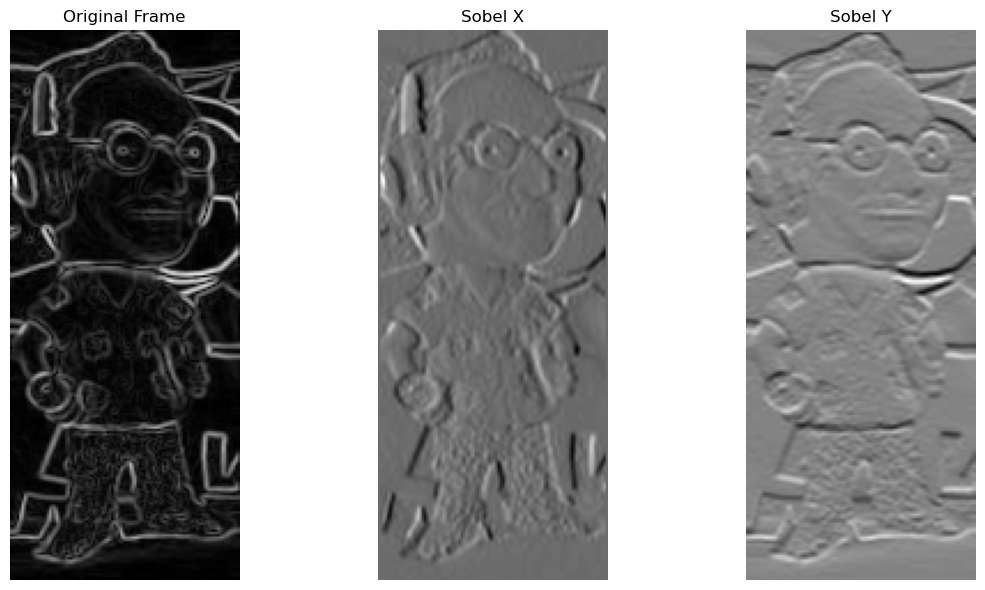

In [207]:
crop1=cv2.imread('HW3/dataset/cropped/crop1.jpg',cv2.IMREAD_GRAYSCALE)
# Apply Sobel filters
sobel_x = cv2.Sobel(crop1, cv2.CV_64F, 1, 0, ksize=3)  # Gradient in x-direction
sobel_y = cv2.Sobel(crop1, cv2.CV_64F, 0, 1, ksize=3)  # Gradient in y-direction

# Compute magnitude of gradients (optional for visualization)
magnitude = cv2.magnitude(sobel_x, sobel_y)

# Plot the results
plt.figure(figsize=(12, 6))

# Original frame
plt.subplot(1, 3, 1)
plt.imshow(magnitude, cmap='gray')
plt.title('Original Frame')
plt.axis('off')

# Sobel x-direction
plt.subplot(1, 3, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X')
plt.axis('off')

# Sobel y-direction
plt.subplot(1, 3, 3)
plt.imshow(sobel_y, cmap='gray')
plt.title('Sobel Y')
plt.axis('off')

plt.tight_layout()
plt.show()

(480, 640, 3)
(480, 640, 3)


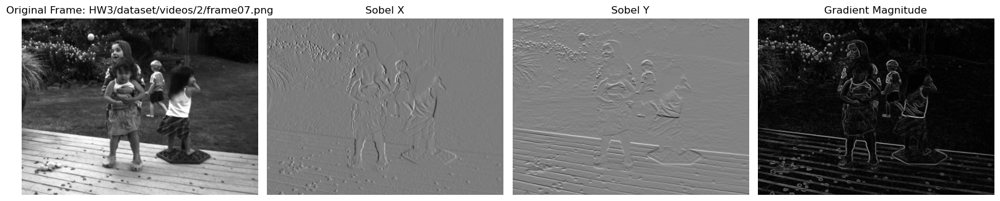

(480, 640, 3)
(480, 640, 3)


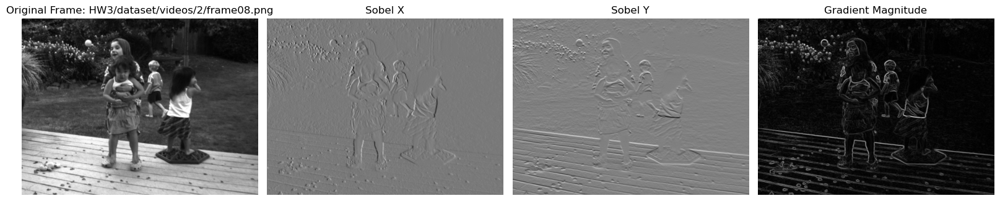

(480, 640, 3)
(480, 640, 3)


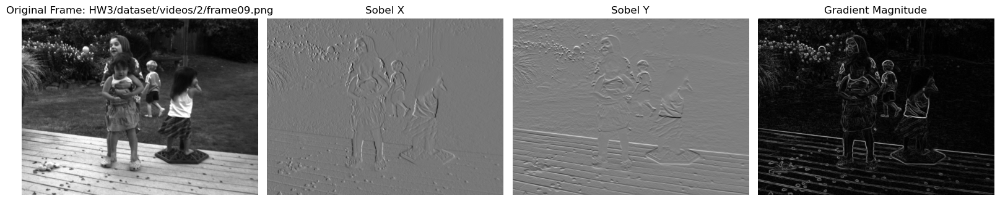

(480, 640, 3)
(480, 640, 3)


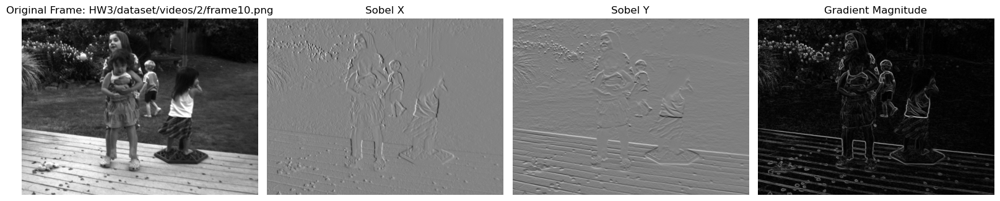

(480, 640, 3)
(480, 640, 3)


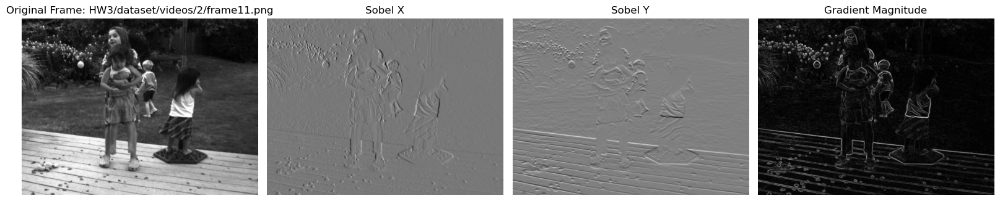

(480, 640, 3)
(480, 640, 3)


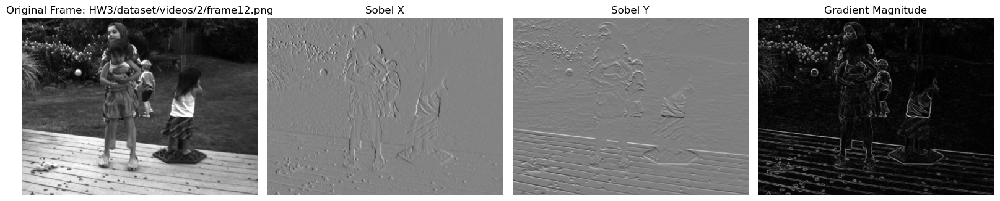

(480, 640, 3)
(480, 640, 3)


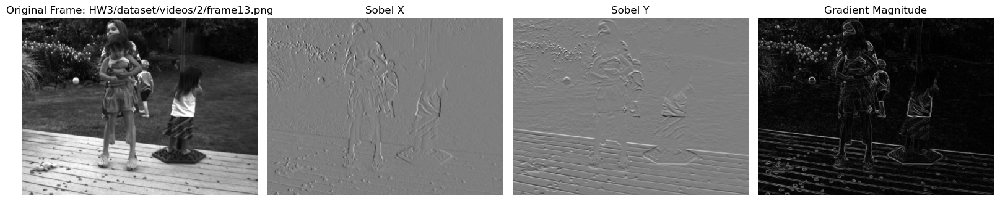

(480, 640, 3)
(480, 640, 3)


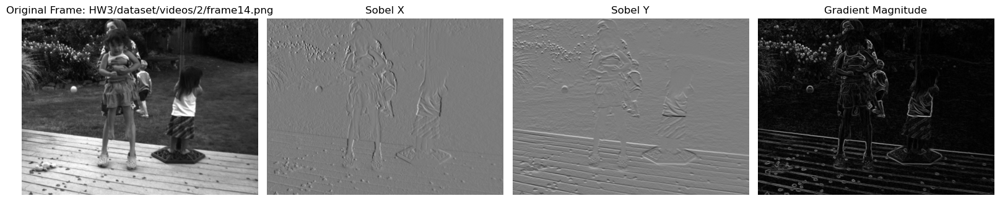

In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob

# List of frame filenames (e.g., frame07.png to frame14.png)
frame_files = sorted(glob.glob("HW3/dataset/videos/2/frame*.png"))

# Iterate over each frame
for frame_file in frame_files:
    # Load the current frame
    frame = cv2.imread(frame_file)
    print(frame.shape)

    x = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    x = 0.299*frame[:,:,2] + 0.587*frame[:,:,0] + 0.114*frame[:,:,1]
    print(frame.shape)
    #frame = cv2.GaussianBlur(frame,ksize=(3,3),sigmaX=1,sigmaY=1) 
    # Apply Sobel filters
    sobel_x = cv2.Sobel(x, cv2.CV_64F, 1, 0, ksize=3)  # Gradient in x-direction
    sobel_y = cv2.Sobel(x, cv2.CV_64F, 0, 1, ksize=3)  # Gradient in y-direction

    # Compute magnitude of gradients
    magnitude = cv2.magnitude(sobel_x, sobel_y)

    # Plot the results
    plt.figure(figsize=(16, 8))

    # Original frame
    plt.subplot(1, 4, 1)
    plt.imshow(x, cmap='gray')
    plt.title(f'Original Frame: {frame_file}')
    plt.axis('off')

    # Sobel x-direction
    plt.subplot(1, 4, 2)
    plt.imshow(sobel_x, cmap='gray')
    plt.title('Sobel X')
    plt.axis('off')

    # Sobel y-direction
    plt.subplot(1, 4, 3)
    plt.imshow(sobel_y, cmap='gray')
    plt.title('Sobel Y')
    plt.axis('off')

    # Gradient magnitude
    plt.subplot(1, 4, 4)
    plt.imshow(magnitude, cmap='gray')
    plt.title('Gradient Magnitude')
    plt.axis('off')

    # Show the plot for the current frame
    plt.tight_layout()
    plt.show()

## LKT

In [ ]:
class LKT:
    
    def __init__(self,template_path,frame_paths,max_it,epsilon,max_level,p_init,epsilon_s):
        self.template_path=template_path
        self.frame_paths=frame_paths
        self.max_it=max_it
        self.epsilon=epsilon
        self.max_level=max_level
        self.p_first=p_init
        self.epsilon_s=epsilon_s

    
    def gen_gauss_pyramid(self,img,max_level):
        pyr=[img]
        for lvl in range (1,max_level):
            pyr.append(cv2.pyrDown(pyr[-1]))
        return pyr

    def bilinear_interpolate(self,img, x, y):
        x1 = np.floor(x).astype(np.int32)
        x2 = x1 + 1
        x1 = np.clip(x1, 0, img.shape[1] - 1)
        x2 = np.clip(x2, 0, img.shape[1] - 1)
        y1 = np.floor(y).astype(np.int32)
        y2 = y1 + 1
        y1 = np.clip(y1, 0, img.shape[0] - 1)
        y2 = np.clip(y2, 0, img.shape[0] - 1)

        # Pixel values of the four neighbors
        q_11 = img[y1, x1]
        q_12 = img[y1, x2]
        q_21 = img[y2, x1]
        q_22 = img[y2, x2]

        # Interpolation weights
        wx1, wx2 = x2 - x, x - x1
        wy1, wy2 = y2 - y, y - y1

        # Bilinear interpolation formula
        result = (q_11 * wx1 * wy1 +
                q_12 * wx2 * wy1 +
                q_21 * wx1 * wy2 +
                q_22 * wx2 * wy2)

        return result
    def lucas_kanade_translation(self,template,frame,p_init):
        p=np.array([p_init[0],p_init[1]],dtype=np.float32)
        h,w=template.shape
        x, y = np.meshgrid(np.arange(w), np.arange(h))
        x ,y = x.ravel().astype(np.float32),y.ravel().astype(np.float32)
        T_x = template.flatten().astype(np.float32)
        sobel_x = cv2.Sobel(frame, cv2.CV_32F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(frame, cv2.CV_32F, 0, 1, ksize=3)
        converge=False
        converges=0
        it=0
        while(converge!=True):
            W_x = x + p[0]
            W_x = np.clip(W_x, 0, frame.shape[1] - 1)
            W_y = y + p[1]
            W_y = np.clip(W_y, 0, frame.shape[0] - 1)
            I_W = self.bilinear_interpolate(frame, W_x, W_y)
            b = I_W - T_x
            Ix = self.bilinear_interpolate(sobel_x, W_x, W_y)
            Iy = self.bilinear_interpolate(sobel_y, W_x, W_y)
            J = np.vstack((Ix, Iy)).T
            H = J.T @ J
            b = -J.T @ b
            delta_p = np.linalg.inv(H) @ b
            p += delta_p
            if np.linalg.norm(delta_p) < self.epsilon:
                converge=True
                converges=it
                break
            else:
                it+=1
        return (p[0], p[1]),converges
    

    def lucas_kanade_pyramidal(self,template, frame, p_init=(0,0)):
        templ_pyr = self.gen_gauss_pyramid(template, self.max_level)
        frame_pyr = self.gen_gauss_pyramid(frame, self.max_level)
        p = (p_init[0] / (2**(self.max_level-1)), p_init[1] / (2**(self.max_level-1)))
        for lvl in range(self.max_level-1, -1, -1):
            tp = templ_pyr[lvl]
            fp = frame_pyr[lvl]
            p,conv= self.lucas_kanade_translation(tp, fp, p)
            if lvl > 0:
                p = (p[0]*2.0, p[1]*2.0)
        return p,conv
    
    def track(self):
        template = cv2.imread(self.template_path)
        template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
        frames = sorted(glob.glob(self.frame_paths))
        print(frames)
        displacements = []
        p = self.p_first

        num_frames = len(frames)
        max_images_per_row = 3  
        num_rows = (num_frames + max_images_per_row - 1) // max_images_per_row  

        plt.figure(figsize=(20, 10))
        plt.suptitle('Tracked Template in Frames and Converged Iterations, epsilon={}, max_iters={}, Pyramid levels={}'.format(self.epsilon, self.max_it, self.max_level), fontsize=16)

        for i, frame_path in enumerate(frames):
            frame = cv2.imread(frame_path)
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            p, conv = self.lucas_kanade_pyramidal(template, frame, p_init=p)
            displacement = (int(p[0]), int(p[1]))
            current_x, current_y = displacement
            displacements.append((current_x, current_y))

            plt.subplot(num_rows, max_images_per_row, i + 1)
            plt.imshow(frame, cmap='gray')
            plt.axis('off')
            plt.gca().add_patch(plt.Rectangle((current_x, current_y), template.shape[1], template.shape[0], edgecolor='r', facecolor='none', linewidth=2))
            plt.title(f'{frame_path[21:]} converged in {conv} iterations')

        plt.tight_layout()
        full_save_path = f"{frame_path[19:20]}_it{self.max_it}_lv{self.max_level}_ep{self.epsilon_s}.png"  
        plt.savefig(full_save_path)  
        plt.show()
        print("Tracked coordinates across frames:", displacements)

In [40]:
template_path1='HW3/dataset/cropped/crop1.jpg'
template_path2='HW3/dataset/cropped/crop2.jpg'
template_path3='HW3/dataset/cropped/crop3.jpg'
frame_paths1="HW3/dataset/videos/1/*.png"
frame_paths2="HW3/dataset/videos/2/*.png"
frame_paths3="HW3/dataset/videos/3/*.png"
max_it=100
max_level=4
epsilon=2e-5
epsilon_s="25"
p_init1=(265,140)
p_init2=(170,35)
p_init3=(45,210)
deneme1=LKT(template_path1,frame_paths1,max_it,epsilon,max_level,p_init1,epsilon_s)
deneme2=LKT(template_path2,frame_paths2,max_it,epsilon,max_level,p_init2,epsilon_s)
deneme3=LKT(template_path3,frame_paths3,max_it,epsilon,max_level,p_init3,epsilon_s)

['HW3/dataset/videos/1/frame07.png', 'HW3/dataset/videos/1/frame08.png', 'HW3/dataset/videos/1/frame09.png', 'HW3/dataset/videos/1/frame10.png', 'HW3/dataset/videos/1/frame11.png', 'HW3/dataset/videos/1/frame12.png', 'HW3/dataset/videos/1/frame13.png', 'HW3/dataset/videos/1/frame14.png']


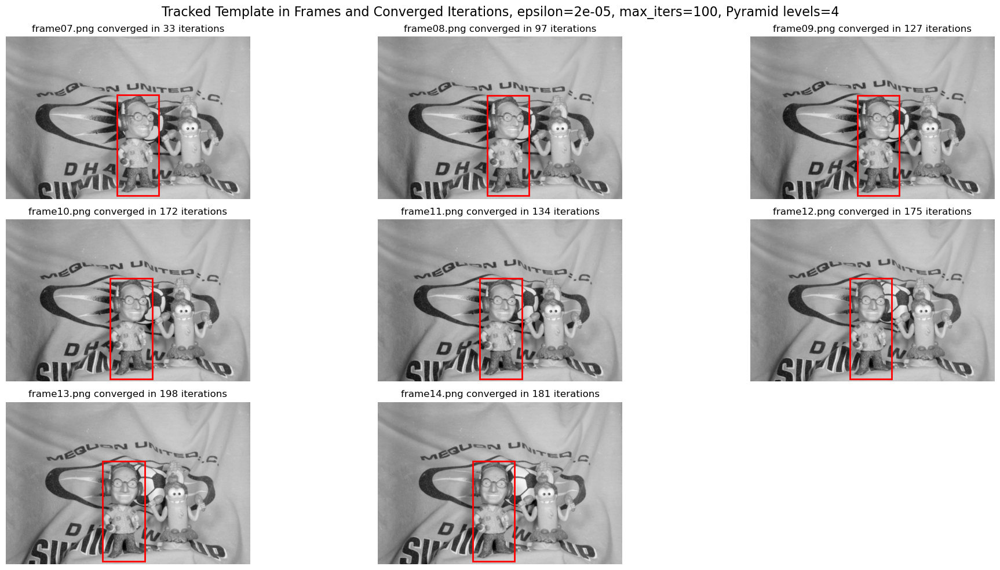

Tracked coordinates across frames: [(265, 139), (260, 140), (255, 140), (249, 141), (243, 141), (237, 141), (231, 141), (226, 141)]
['HW3/dataset/videos/2/frame07.png', 'HW3/dataset/videos/2/frame08.png', 'HW3/dataset/videos/2/frame09.png', 'HW3/dataset/videos/2/frame10.png', 'HW3/dataset/videos/2/frame11.png', 'HW3/dataset/videos/2/frame12.png', 'HW3/dataset/videos/2/frame13.png', 'HW3/dataset/videos/2/frame14.png']


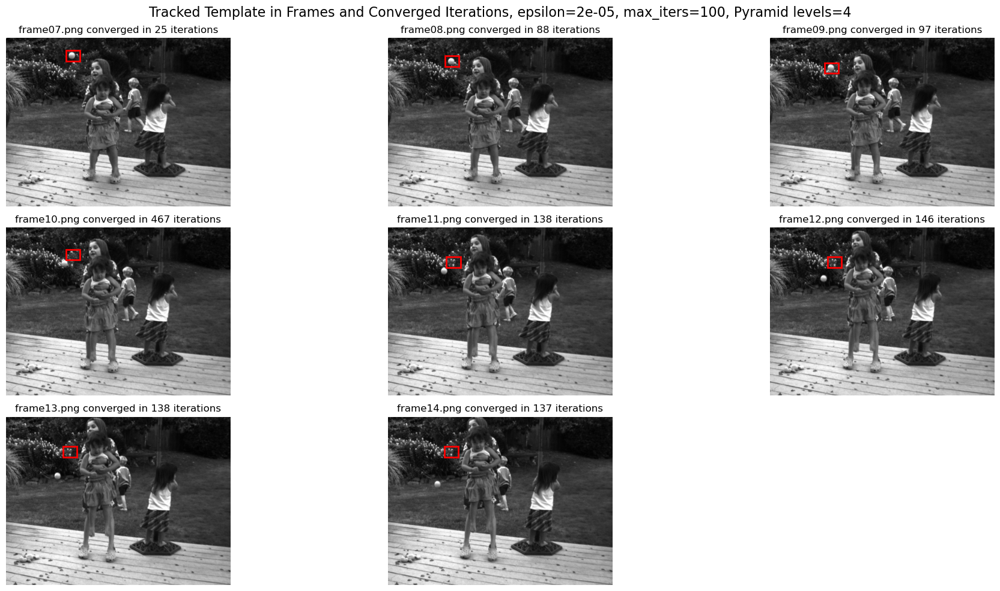

Tracked coordinates across frames: [(170, 35), (162, 51), (155, 70), (170, 62), (166, 84), (164, 84), (162, 84), (160, 84)]
['HW3/dataset/videos/3/f1.png', 'HW3/dataset/videos/3/f2.png', 'HW3/dataset/videos/3/f3.png', 'HW3/dataset/videos/3/f4.png', 'HW3/dataset/videos/3/f5.png', 'HW3/dataset/videos/3/f6.png', 'HW3/dataset/videos/3/f7.png', 'HW3/dataset/videos/3/f8.png', 'HW3/dataset/videos/3/f9.png', 'HW3/dataset/videos/3/f91.png', 'HW3/dataset/videos/3/f911.png', 'HW3/dataset/videos/3/f912.png']


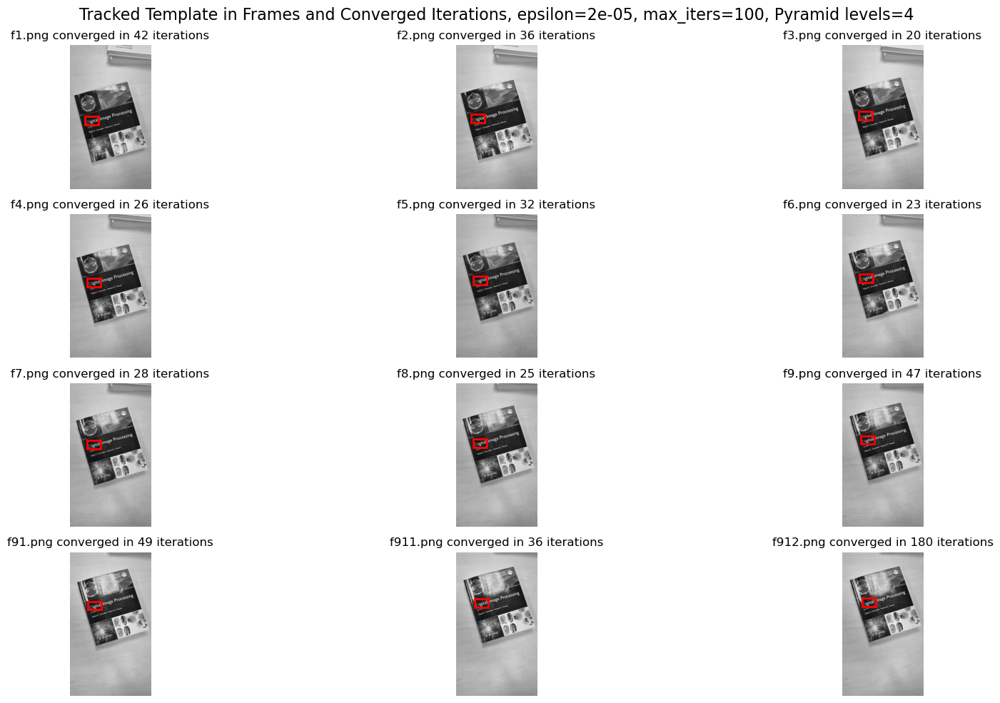

Tracked coordinates across frames: [(44, 210), (45, 203), (49, 195), (51, 189), (51, 183), (50, 176), (50, 169), (51, 164), (54, 155), (53, 145), (54, 138), (58, 135)]


In [41]:
deneme1.track()
deneme2.track()
deneme3.track()

## KLT

In [ ]:
class KLT:
    def __init__(self, template_path, frame_paths, p_init, max_it, epsilon, levels, threshold, window_size,epsilon_s):
        self.template = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)
        self.frame_paths = sorted(glob.glob(frame_paths))
        self.frames = [cv2.imread(frame, cv2.IMREAD_GRAYSCALE) for frame in self.frame_paths]
        self.p_init = p_init
        self.max_it = max_it
        self.epsilon = epsilon
        self.levels = levels
        self.threshold = threshold
        self.window_size = window_size
        self.bounding_box = (p_init[0], p_init[1], self.template.shape[1], self.template.shape[0])
        self.epsilon_s=epsilon_s

    def harris_corner_detection(self, image, threshold, bounding_region, k=0.04):
        sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

        Ixx = sobel_x ** 2
        Iyy = sobel_y ** 2
        Ixy = sobel_x * sobel_y

        Ixx = cv2.GaussianBlur(Ixx, (5, 5), sigmaX=1)
        Iyy = cv2.GaussianBlur(Iyy, (5, 5), sigmaX=1)
        Ixy = cv2.GaussianBlur(Ixy, (5, 5), sigmaX=1)

        det_M = Ixx * Iyy - Ixy ** 2
        trace_M = Ixx + Iyy
        R = det_M - k * (trace_M ** 2)

        R_max = R.max()
        corner_mask = R > (threshold * R_max)

        local_max = (R == maximum_filter(R, size=3))
        final_mask = corner_mask & local_max

        x, y, w, h = bounding_region
        corner_points = []
        for point in np.argwhere(final_mask):
            px, py = point[1], point[0]
            if x <= px < x + w and y <= py < y + h:
                corner_points.append((px, py))

        return corner_points

    def get_around_corner_window(self, frame, corner, window_size):
        x, y = int(corner[0]), int(corner[1])
        half_w = window_size // 2

        x_min = max(0, x - half_w)
        x_max = min(frame.shape[1], x + half_w + 1)
        y_min = max(0, y - half_w)
        y_max = min(frame.shape[0], y + half_w + 1)

        window = frame[y_min:y_max, x_min:x_max]
        return window




    
    def lucas_kanade_translation(self, template, frame, p_init, max_it, epsilon):
        p = np.array([p_init[0], p_init[1]], dtype=np.float32)
        h, w = template.shape
        x, y = np.meshgrid(np.arange(w), np.arange(h))
        x, y = x.ravel().astype(np.float32), y.ravel().astype(np.float32)
        T_x = template.flatten().astype(np.float32)
        sobel_x = cv2.Sobel(frame, cv2.CV_32F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(frame, cv2.CV_32F, 0, 1, ksize=3)
        converge=False
        converges=0
        it=0
        for it in range(max_it):
            W_x = x + p[0]
            W_x = np.clip(W_x, 0, frame.shape[1] - 1)
            W_y = y + p[1]
            W_y = np.clip(W_y, 0, frame.shape[0] - 1)
            I_W = self.bilinear_interpolate(frame, W_x, W_y)
            b = I_W - T_x
            Ix = self.bilinear_interpolate(sobel_x, W_x, W_y)
            Iy = self.bilinear_interpolate(sobel_y, W_x, W_y)
            J = np.vstack((Ix, Iy)).T
            H = J.T @ J
            b = -J.T @ b
            try:
                delta_p = np.linalg.inv(H) @ b
            except np.linalg.LinAlgError:
                break
            p += delta_p
            if np.linalg.norm(delta_p) < epsilon:
                converge=it+1
                break
            else:
                converge=max_it
        return (p[0], p[1]), converge

    def bilinear_interpolate(self, img, x, y):
        x1 = np.floor(x).astype(np.int32)
        x2 = x1 + 1
        x1 = np.clip(x1, 0, img.shape[1] - 1)
        x2 = np.clip(x2, 0, img.shape[1] - 1)
        y1 = np.floor(y).astype(np.int32)
        y2 = y1 + 1
        y1 = np.clip(y1, 0, img.shape[0] - 1)
        y2 = np.clip(y2, 0, img.shape[0] - 1)

        q_11 = img[y1, x1]
        q_12 = img[y1, x2]
        q_21 = img[y2, x1]
        q_22 = img[y2, x2]

        wx1, wx2 = x2 - x, x - x1
        wy1, wy2 = y2 - y, y - y1

        result = (q_11 * wx1 * wy1 +
                  q_12 * wx2 * wy1 +
                  q_21 * wx1 * wy2 +
                  q_22 * wx2 * wy2)

        return result

    def lucas_kanade_pyramidal(self, template, frame, levels=3, p_init=(0, 0), max_iterations=100, epsilon=1e-3):
        templ_pyr = self.build_gaussian_pyramid(template, levels)
        frame_pyr = self.build_gaussian_pyramid(frame, levels)
        p = (p_init[0] / (2**(levels-1)), p_init[1] / (2**(levels-1)))
        for lvl in range(levels-1, -1, -1):
            p,converge= self.lucas_kanade_translation(templ_pyr[lvl], frame_pyr[lvl], p, max_iterations, epsilon)
            if lvl > 0:
                p = (p[0]*2.0, p[1]*2.0)
        return p,converge

    def build_gaussian_pyramid(self, image, levels):
        pyramid = [image]
        for _ in range(1, levels):
            pyramid.append(cv2.pyrDown(pyramid[-1]))
        return pyramid

    def track_points(self, corners, frame, next_frame, window_size=15, max_iters=200, epsilon=1e-4, levels=3):
        tracked_corners = []
        for corner in corners:
            around_corner_window = self.get_around_corner_window(frame, corner, window_size)
            displacement,converge = self.lucas_kanade_pyramidal(around_corner_window, next_frame, levels=levels, p_init=corner, max_iterations=max_iters, epsilon=epsilon)
            new_corner = (displacement[0], displacement[1])
            tracked_corners.append(new_corner)
        return tracked_corners,converge

    def estimate_bounding_box(self, tracked_corners, original_template):
        mean_x, mean_y = np.floor(np.mean(tracked_corners, axis=0)).astype(np.int32)
        width = original_template.shape[1]
        height = original_template.shape[0]
        x_min = mean_x - width / 2
        y_min = mean_y - height / 2
        return np.floor((x_min, y_min, width, height)).astype(np.int32)

    def run(self):

        x_min, y_min, width, height = self.bounding_box
        num_frames = len(self.frames)
        max_images_per_row = 3  
        num_rows = (num_frames + max_images_per_row - 1) // max_images_per_row  

        plt.figure(figsize=(20, 10))
       
        plt.subplot(num_rows, max_images_per_row, 1)
        f_corners = self.harris_corner_detection(self.frames[0], threshold=self.threshold, bounding_region=(x_min, y_min, width, height))
        plt.imshow(self.frames[0], cmap='gray')
        plt.axis('off')
        plt.title("First Frame {}, Number of Corners: {}".format(self.frame_paths[0][21:], len(f_corners)))
        for corner in f_corners:
            plt.scatter(corner[0], corner[1], c='r', s=1)
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), width, height, edgecolor='g', facecolor='none', linewidth=2))
        plt.suptitle("Frames with Tracked Corners and Bounding Boxes and Average Convergence, epsilon={}, max_iters={}, Pyramid levels={}, window_size={}, threshold={}".format(self.epsilon, self.max_it, self.levels, self.window_size, self.threshold), fontsize=16)

        for i in range(num_frames - 1):
            frame = self.frames[i]
            next_frame = self.frames[i + 1]
            corners = self.harris_corner_detection(frame, threshold=self.threshold, bounding_region=(x_min, y_min, width, height))
            tracked_corners, converge = self.track_points(corners, frame, next_frame, window_size=self.window_size, max_iters=self.max_it, epsilon=self.epsilon, levels=self.levels)
            self.bounding_box = self.estimate_bounding_box(tracked_corners, self.template)
            x_min, y_min, width, height = self.bounding_box

            plt.subplot(num_rows, max_images_per_row, i + 2)
            plt.imshow(self.frames[i + 1], cmap='gray')
            for corner in tracked_corners:
                plt.scatter(corner[0], corner[1], c='r', s=1)
            plt.gca().add_patch(plt.Rectangle((x_min, y_min), width, height, edgecolor='g', facecolor='none', linewidth=2))
            plt.title("{frame} Number of Tracked corners: {num_corner}, average convergence: {converg} ".format(frame=self.frame_paths[i + 1][21:], num_corner=len(tracked_corners), converg=np.mean(converge)), fontsize=12)
            plt.axis('off')

        plt.tight_layout()
        full_save_path = f"KLT_{self.frame_paths[0][19:20]}_it{self.max_it}_lv{self.levels}_ep{self.epsilon_s}_th{self.threshold}_.png"  # Combine save path and file name
        plt.savefig(full_save_path)  
        plt.show()




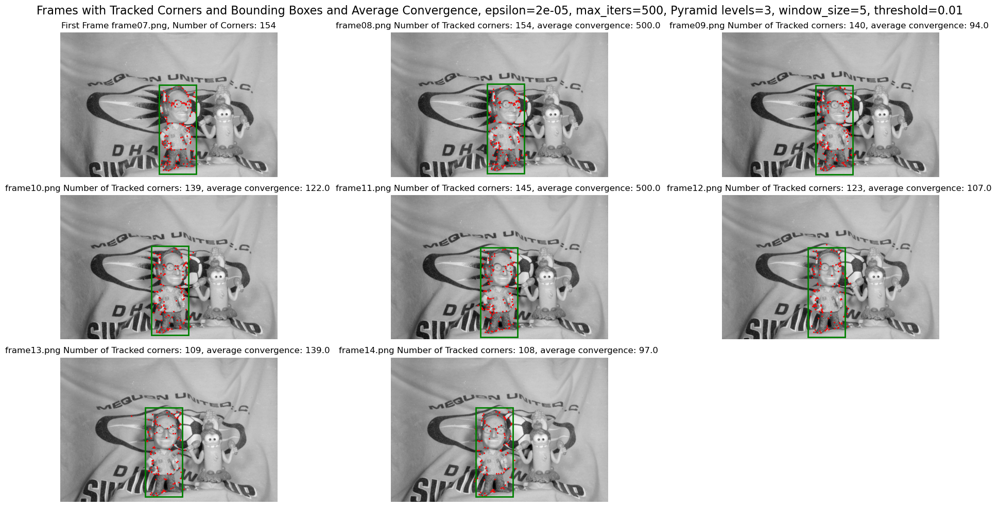

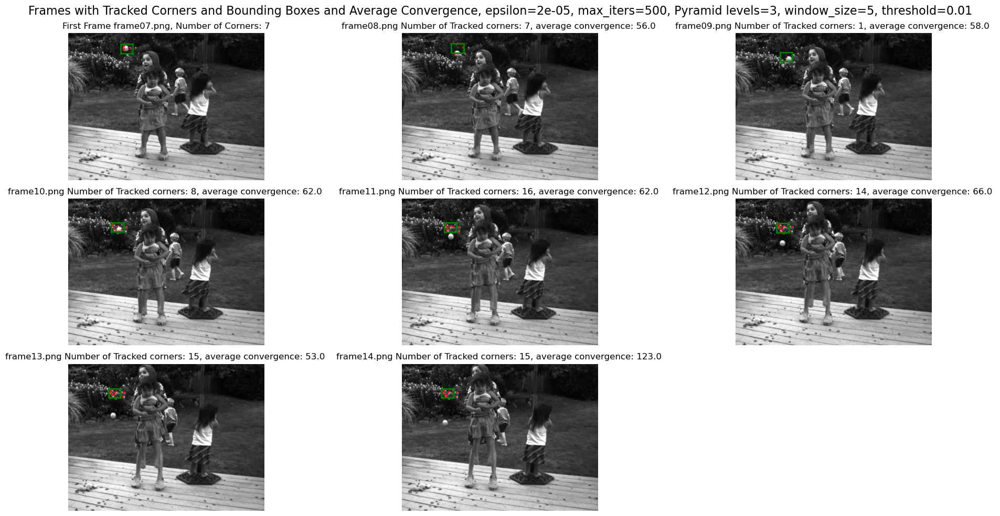

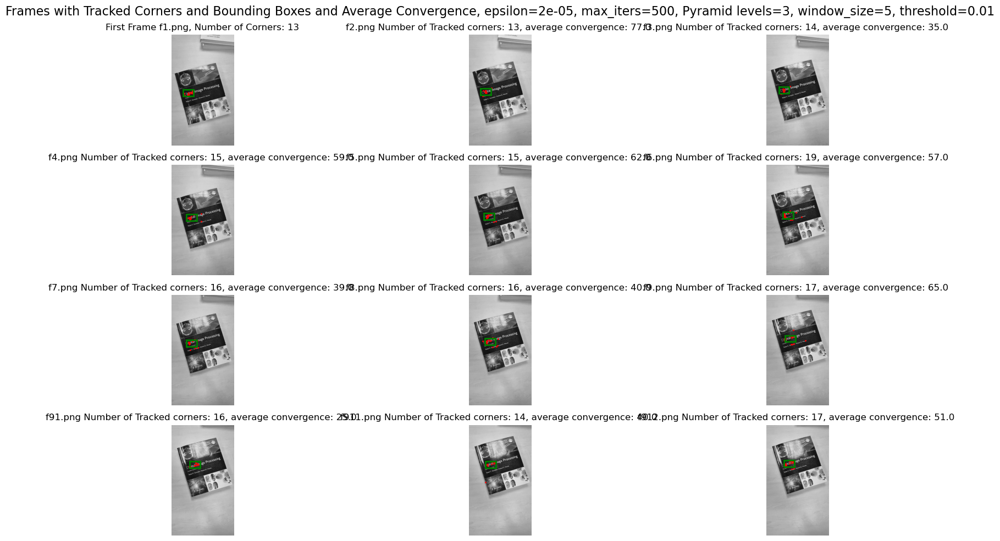

In [44]:
template_path1='HW3/dataset/cropped/crop2_2.jpg'
frame_paths1="HW3/dataset/videos/2/*.png"
p_init1=(170,35)
max_it=500
epsilon=2e-5
epsilon_s="25"
template_path1='HW3/dataset/cropped/crop1.jpg'
template_path2='HW3/dataset/cropped/crop2.jpg'
template_path2_2='HW3/dataset/cropped/crop2_3.jpg'
template_path3='HW3/dataset/cropped/crop3.jpg'
frame_paths1="HW3/dataset/videos/1/*.png"
frame_paths2="HW3/dataset/videos/2/*.png"
frame_paths2_2="HW3/dataset/videos/2_2/*.png"
frame_paths3="HW3/dataset/videos/3/*.png"
p_init1=(265,140)
p_init2=(170,35)
p_init2_2=(176,38)
p_init3=(45,210)
tracker1 = KLT(template_path1, frame_paths1, p_init1, max_it, epsilon, levels=3, threshold=0.01, window_size=5,epsilon_s=epsilon_s)
tracker1.run()
tracker2 = KLT(template_path2, frame_paths2, p_init2, max_it, epsilon, levels=3, threshold=0.01, window_size=5,epsilon_s=epsilon_s)
tracker2.run()
#tracker2_2 = KLT(template_path2, frame_paths2_2, p_init2_2, max_it, epsilon, levels=3, threshold=0.01, window_size=5,epsilon_s=epsilon_s)
#tracker2_2.run()
tracker3 = KLT(template_path3, frame_paths3, p_init3, max_it, epsilon, levels=3, threshold=0.01, window_size=5,epsilon_s=epsilon_s)
tracker3.run()


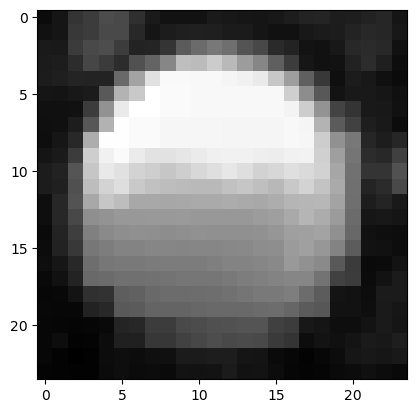

In [ ]:
frame=cv2.imread('HW3/dataset/videos/2/frame07.png',cv2.IMREAD_GRAYSCALE)
frame2=cv2.imread('HW3/dataset/cropped/crop2_2.jpg',cv2.IMREAD_GRAYSCALE)
frame=frame[38:62,176:200]
plt.imshow(frame,cmap='gray')


In [ ]:
frame.shap

(24, 24)

In [253]:
frame.shape

(24, 24)